In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
from itertools import combinations
import anndata
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import random

import plotting_functions as pf

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
plate_palette = sns.color_palette("husl", n_colors=3)
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


# QC plotting - 200 /500 UMI merged adata

In [3]:
adata = sc.read("../IGVF_analysis/preprocessed_tissues/GonadsFemalepreprocessed.h5ad")


In [4]:
adata.layers['raw_counts'] = adata.X.copy()


In [5]:
adata

AnnData object with n_obs × n_vars = 1187438 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch'
    var: 'gene_name'
    layers: 'raw_counts'

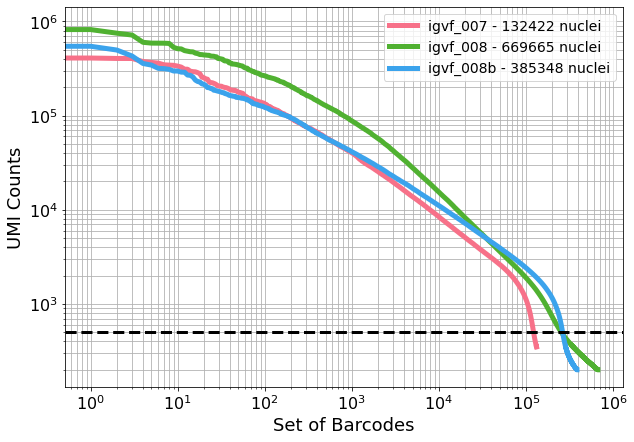

In [6]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

In [7]:
# set var names to be gene names, not gene ID
adata.var_names  = adata.var['gene_name']
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)


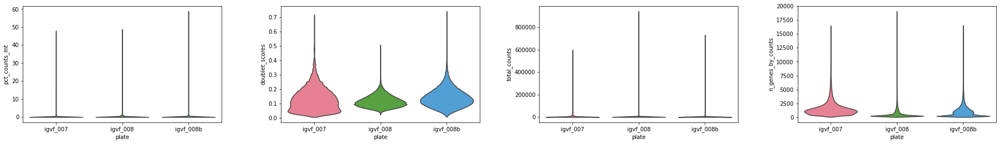

In [8]:
plate_palette = sns.color_palette("husl", n_colors=3)

sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

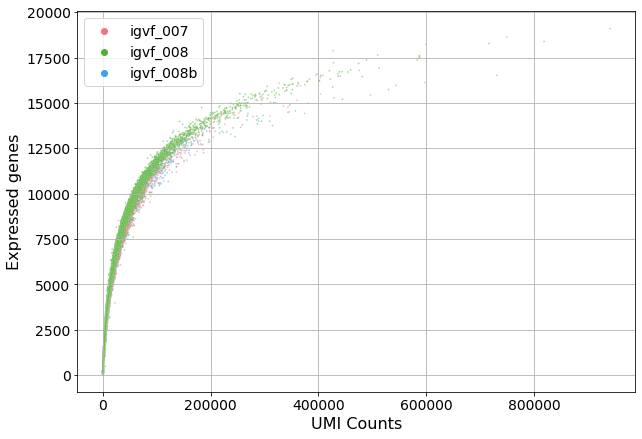

In [9]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

In [10]:
adatas = adata[(adata.obs['total_counts'] < 10000) & (adata.obs['n_genes_by_counts'] < 2000), :]


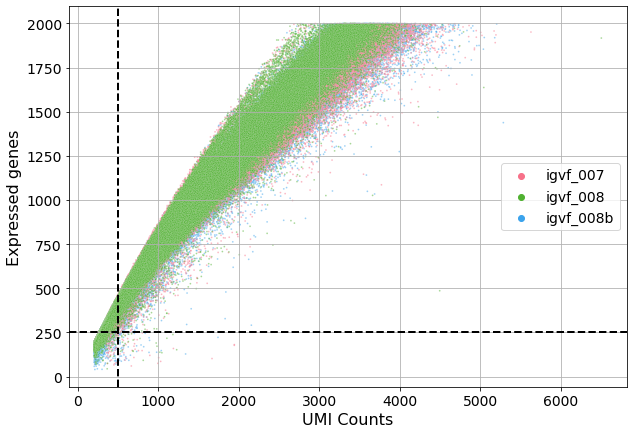

In [11]:
pf.plot_genes_by_counts(adatas, category_column='plate', figsize=(10, 7))

plt.axvline(x=500, color='k', linestyle='--', linewidth=2)
plt.axhline(y=250, color='k', linestyle='--', linewidth=2)

plt.show()

In [12]:
adatas[(adatas.obs['total_counts'] > 500) & (adatas.obs['n_genes_by_counts'] < 250), :]


View of AnnData object with n_obs × n_vars = 113 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'raw_counts'

# QC plotting - filtered data
500 UMI, 250 genes, 1% mito, 0.25 doublet score


In [9]:
adata = sc.read("../IGVF_analysis/tissue_processed_500umi/GonadsFemale_processed.h5ad")


In [10]:
adata_008 = adata[adata.obs['plate'] == 'igvf_008']
adata_008.obs['subpool'].value_counts()

subpool
Sublibrary_2     29919
Sublibrary_6     29709
Sublibrary_8     27340
Sublibrary_4     26632
Sublibrary_3     26549
Sublibrary_7     26451
Sublibrary_9     25738
Sublibrary_10    25620
Sublibrary_5     24860
Name: count, dtype: int64

In [4]:
adata

AnnData object with n_obs × n_vars = 588828 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means

In [9]:
print(adata.obs['Genotype'].value_counts())

adata = adata[adata.obs['Genotype'] != "tie",:]

print(adata.obs['Genotype'].value_counts())

Genotype
NODJ      89835
AJ        76108
129S1J    74642
NZOJ      72676
PWKJ      70541
WSBJ      70186
B6J       69699
CASTJ     65117
tie          24
Name: count, dtype: int64
Genotype
NODJ      89835
AJ        76108
129S1J    74642
NZOJ      72676
PWKJ      70541
WSBJ      70186
B6J       69699
CASTJ     65117
Name: count, dtype: int64


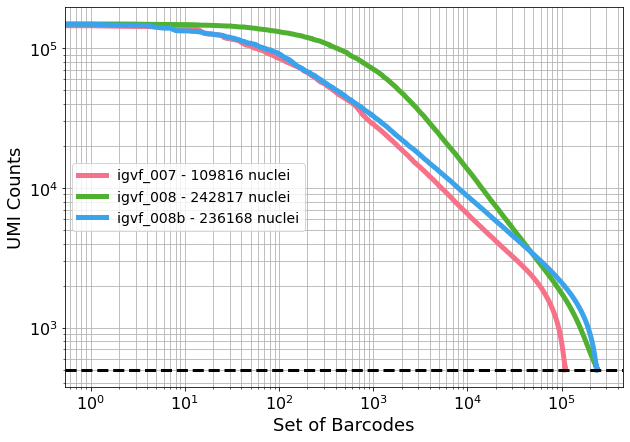

In [5]:
pf.plot_knee(adata, cutoff=500, category_column='plate', figsize=(10, 7))
plt.show()

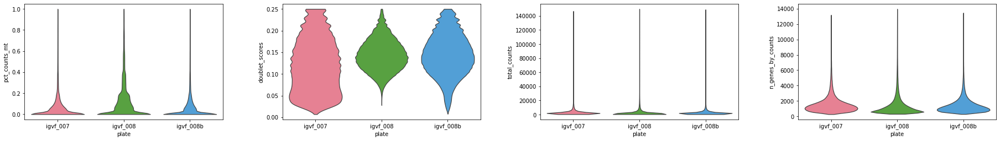

In [6]:
sc.pl.violin(adata, ['pct_counts_mt', 'doublet_scores', 'total_counts', 'n_genes_by_counts'],
             groupby = "plate", palette = plate_palette,
             jitter=0.4, multi_panel=True, size=0)

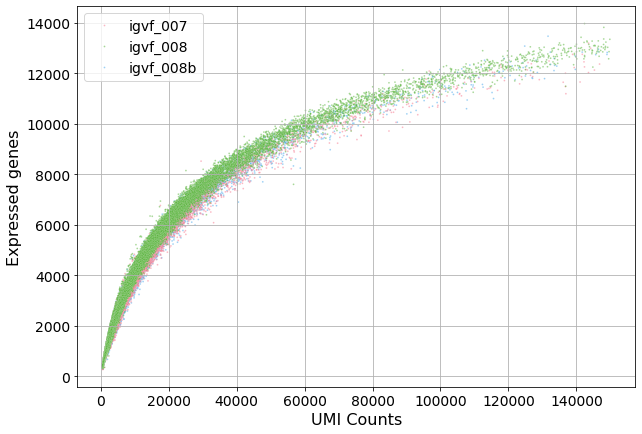

In [7]:
pf.plot_genes_by_counts(adata, category_column='plate', figsize=(10, 7))
plt.show()

# Check clustering
Plate, sex, genotype

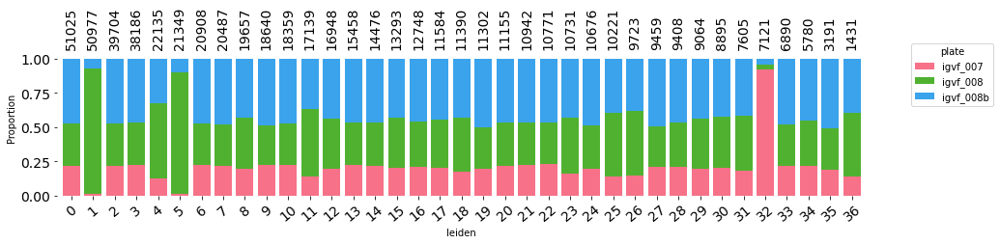

In [5]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)


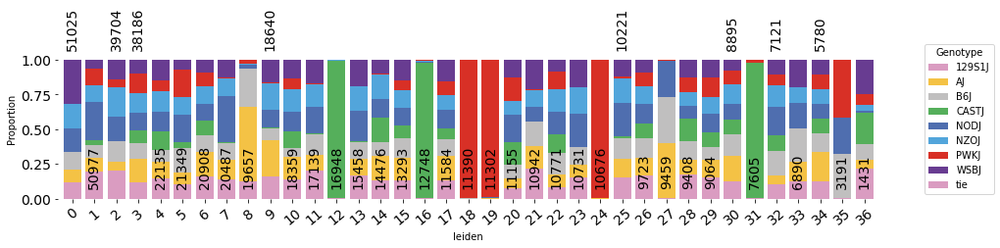

In [6]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = True)


/tmp/ipykernel_1615071/3156761390.py:18: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)


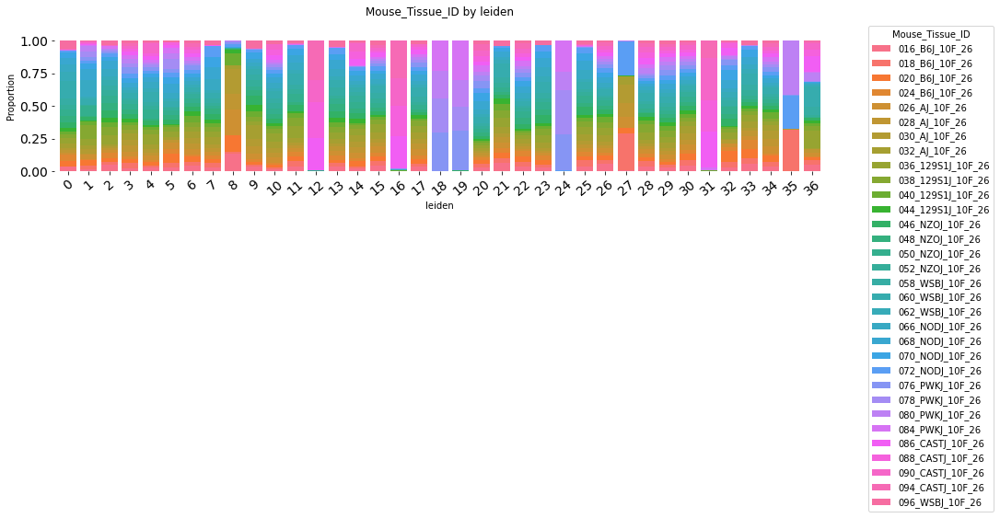

In [10]:
# adjust mouse_tissue_id
# sample genotypes for each 'Multiplexed_sampleN'
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9.0, 10.0, 11.0, 12.0]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']

meta = adata.obs

# Apply the function to update the 'Mouse_Tissue_ID' column
meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)
adata.obs['Mouse_Tissue_ID'] = meta['Mouse_Tissue_ID']
pf.stacked_barplot_proportions(adata.obs, 
                               'leiden', 'Mouse_Tissue_ID',
                               flip=False, fsize = (15,3), 
                               annotations = False)

In [11]:
df = adata.obs[['Mouse_Tissue_ID','Estrus_cycle','plate']]
df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
df['Estrus_cycle'] = df['Estrus_cycle'].astype('str').replace('nan', 'NA')
df['Estrus_cycle'].value_counts()
adata.obs['Estrus_cycle'] = df['Estrus_cycle']

/tmp/ipykernel_1615071/3645533663.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
/tmp/ipykernel_1615071/3645533663.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
/tmp/ipykernel_1615071/3645533663.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

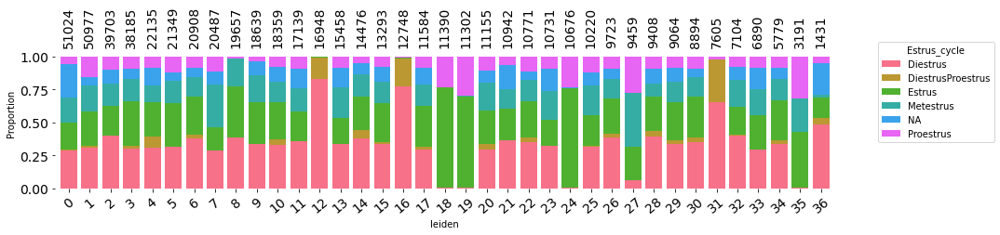

In [13]:
pf.stacked_barplot_proportions(adata.obs, 
                               'leiden', 'Estrus_cycle',
                               flip=False, fsize = (15,3), 
                               annotations = True)

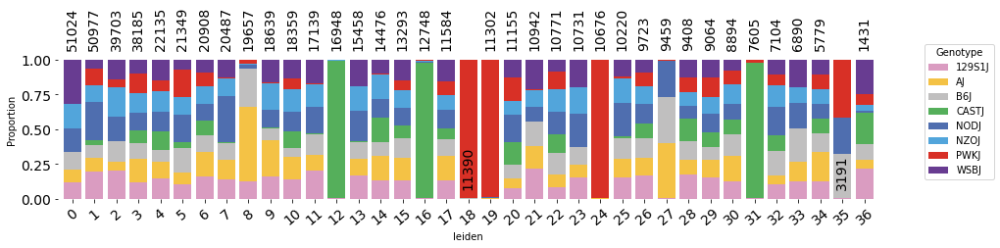

In [14]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


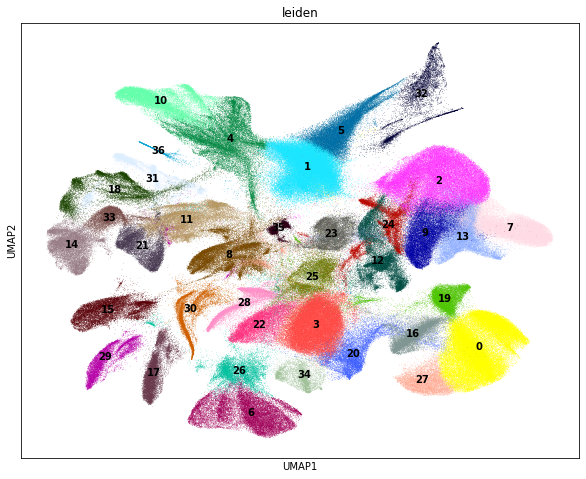

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


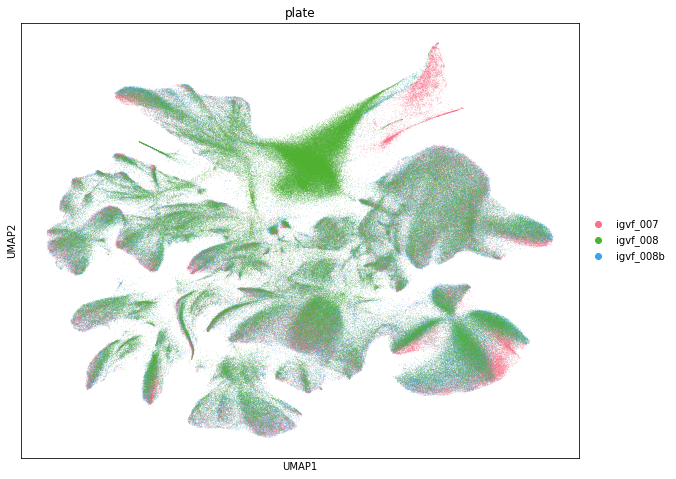

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


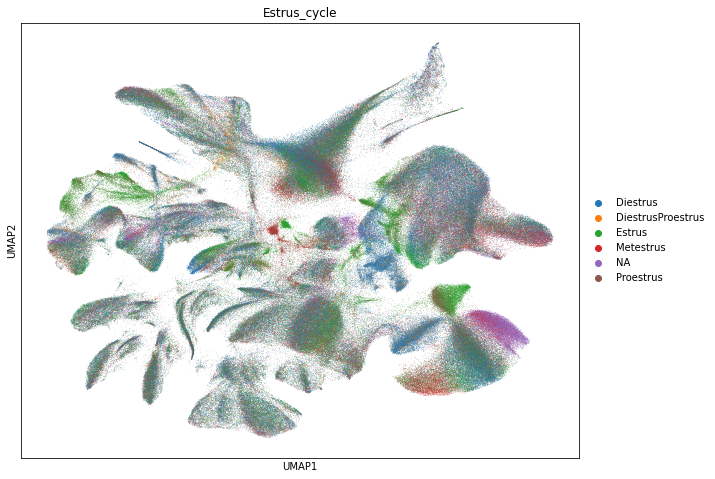

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


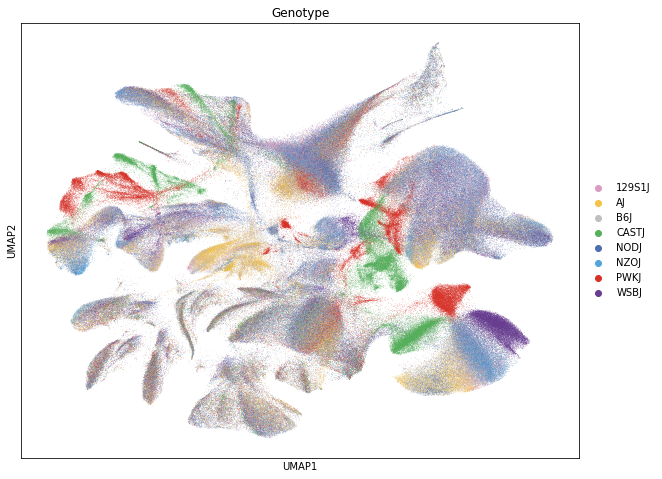

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


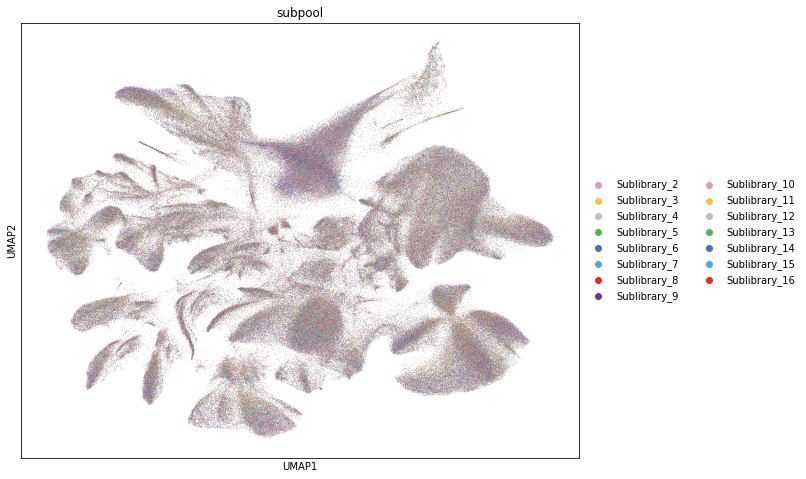

In [15]:
plt.rcParams['figure.figsize'] = (10, 8)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Estrus_cycle'], size = 0.8)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)

sc.pl.umap(adata, color=['subpool'], size = 0.8, palette = geno_palette)




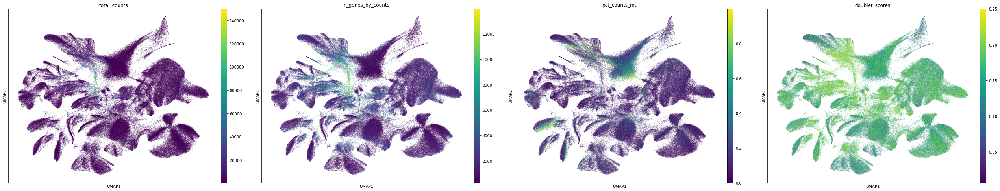

In [16]:
sc.pl.umap(adata, color=['total_counts','n_genes_by_counts','pct_counts_mt', 'doublet_scores'], size = 1)


In [18]:
adata.var_names  = adata.var['gene_name']


categories: 0, 1, 2, etc.
var_group_labels: Adrenal, Brain, Female, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


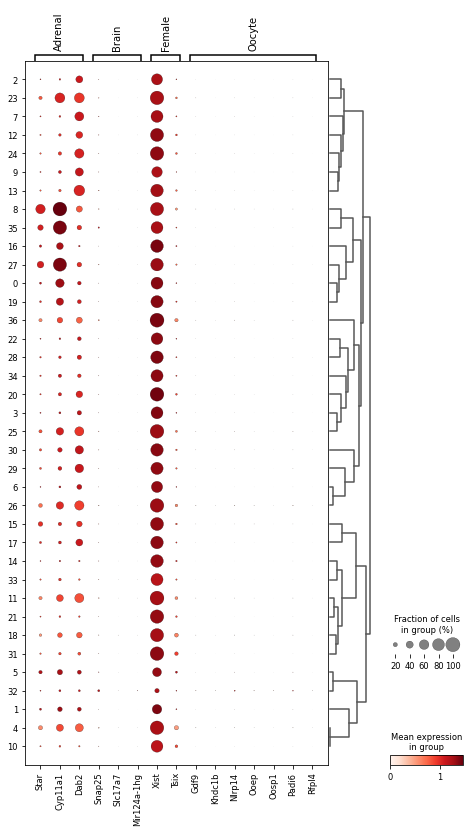

In [27]:
marker_genes_dict = {
    "Adrenal": ['Star','Cyp11a1','Dab2'],
    "Brain": ['Snap25','Slc17a7','Mir124a-1hg'],
    "Female": ["Xist","Tsix"],
    "Oocyte": ["Gdf9","Khdc1b","Nlrp14","Ooep",
                  "Oosp1","Padi6","Rfpl4"]

}


sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


# Remove large low-quality clusters and re-cluster

In [30]:
adata = adata[~adata.obs['leiden'].isin(["1","5","32"])]



In [31]:
adata

View of AnnData object with n_obs × n_vars = 509374 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable'

In [32]:
adata.uns['log1p']["base"] = None

In [33]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

adatas = adata[:, adata.var.highly_variable]



/opt/apps/python/3.8.0/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [34]:
sc.pp.regress_out(adatas, ['pct_counts_mt','n_genes_by_counts'])
sc.pp.scale(adatas, max_value=10)

sc.tl.pca(adatas, svd_solver='arpack', use_highly_variable = True)
sc.pp.neighbors(adatas, n_neighbors=20, n_pcs=30)

sc.tl.leiden(adatas, resolution = 1)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/opt/apps/python/3.8.0/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarni

In [35]:
sc.tl.umap(adatas, min_dist = 0.5, spread =2.0)

In [36]:
adata.uns['neighbors'] = adatas.uns['neighbors']
adata.uns['leiden'] = adatas.uns['leiden']
adata.uns['umap'] = adatas.uns['umap']
adata.obs['leiden'] = adatas.obs['leiden']
adata.obsm = adatas.obsm
adata.obsp = adatas.obsp
adata.write_h5ad('../IGVF_analysis/annotated_tissues/GonadsFemale_filtered.h5ad')


In [37]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsFemale_filtered.h5ad')


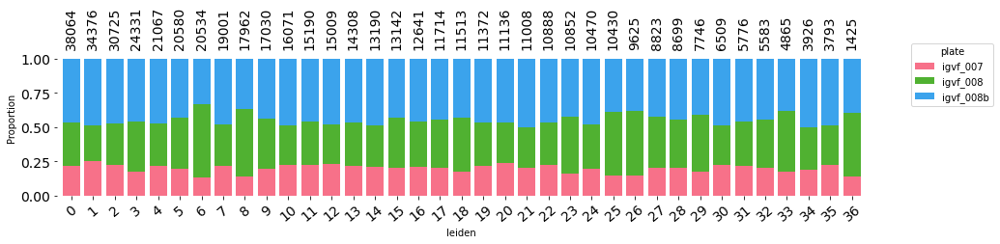

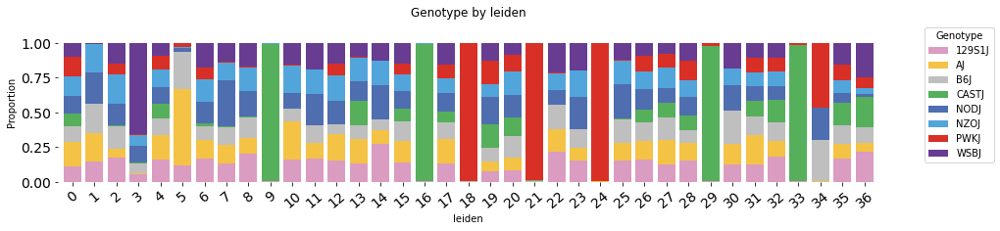

In [4]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'plate',
                            flip=False, fsize = (15,3), 
                            annotations = True)

pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Genotype',
                            flip=False, fsize = (15,3), 
                            annotations = False)


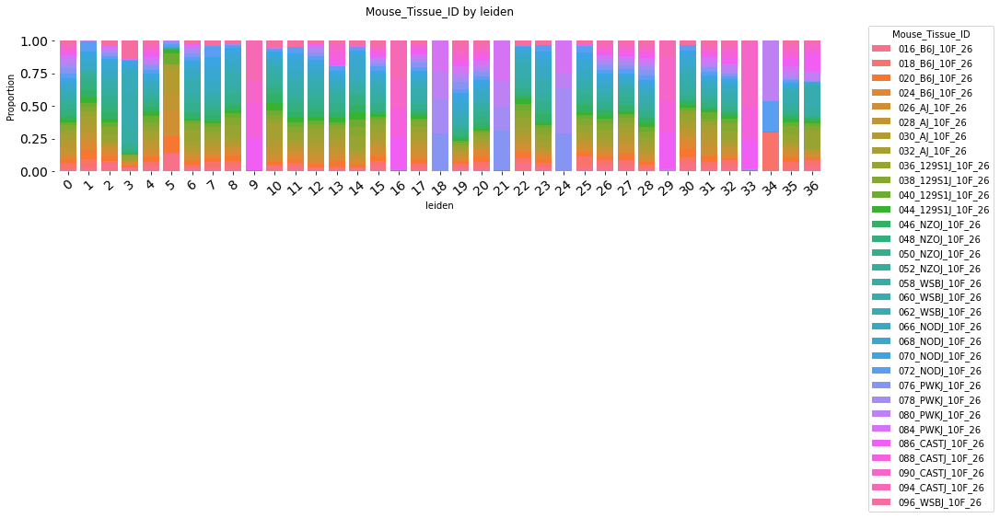

In [5]:
# adjust mouse_tissue_id
# sample genotypes for each 'Multiplexed_sampleN'
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9.0, 10.0, 11.0, 12.0]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']

meta = adata.obs

# Apply the function to update the 'Mouse_Tissue_ID' column
meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)
adata.obs['Mouse_Tissue_ID'] = meta['Mouse_Tissue_ID']
pf.stacked_barplot_proportions(adata.obs, 
                               'leiden', 'Mouse_Tissue_ID',
                               flip=False, fsize = (15,3), 
                               annotations = False)

In [23]:
df = adata.obs[['Mouse_Tissue_ID','Estrus_cycle','plate']]
df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
df['Estrus_cycle'] = df['Estrus_cycle'].astype('str').replace('nan', 'NA')
df['Estrus_cycle'].value_counts()
adata.obs['Estrus_cycle'] = df['Estrus_cycle']

/tmp/ipykernel_1439620/3645533663.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df['Estrus_cycle'].mask(df['Estrus_cycle'].eq('NA'), pd.NA)
/tmp/ipykernel_1439620/3645533663.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Estrus_cycle'] = df.groupby('Mouse_Tissue_ID')['Estrus_cycle'].transform(lambda group: group.ffill().bfill())
/tmp/ipykernel_1439620/3645533663.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

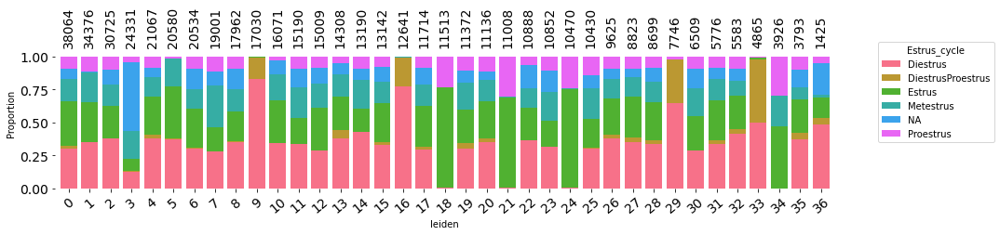

In [24]:
pf.stacked_barplot_proportions(adata.obs, 
                            'leiden', 'Estrus_cycle',
                            flip=False, fsize = (15,3), 
                            annotations = True)

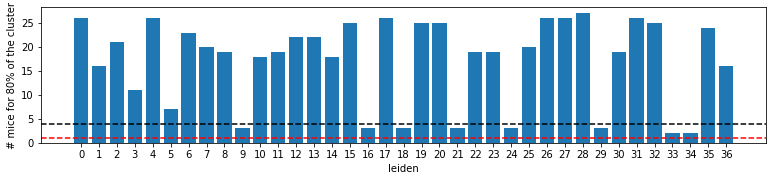

In [6]:
unique_clusters = adata.obs['leiden'].unique()

result_dict = {'leiden': [], 'n_mice_per_cluster': []}

for cluster in unique_clusters:
    # Filter data for the specific cluster
    cluster_data = adata.obs.loc[adata.obs['leiden'] == cluster, 'Mouse_Tissue_ID'].value_counts()
    cumulative_percentage = cluster_data.cumsum() / cluster_data.sum()
    num_tissue_ids_percent = (cumulative_percentage <= 0.9).sum() 
    
    result_dict['leiden'].append(cluster)
    result_dict['n_mice_per_cluster'].append(num_tissue_ids_percent)

result_df = pd.DataFrame(result_dict)

result_df['leiden'] = pd.to_numeric(result_df['leiden'])
result_df = result_df.sort_values(by='leiden')
result_df['leiden'] = result_df['leiden'].astype(str)

plt.figure(figsize=(13,2.5))
plt.bar(result_df['leiden'], result_df['n_mice_per_cluster'])
plt.xlabel('leiden')
plt.ylabel('# mice for 80% of the cluster')

plt.axhline(y=4, color='black', linestyle='--')
plt.axhline(y=1, color='red', linestyle='--')


plt.show()

In [18]:
adata.obs.loc[adata.obs['leiden'] == '5', 'Mouse_Tissue_ID'].value_counts().head(10)

Mouse_Tissue_ID
026_AJ_10F_26        4045
030_AJ_10F_26        3838
016_B6J_10F_26       2672
028_AJ_10F_26        2623
020_B6J_10F_26       2559
040_129S1J_10F_26    1790
032_AJ_10F_26         771
044_129S1J_10F_26     611
072_NODJ_10F_26       348
076_PWKJ_10F_26       343
Name: count, dtype: int64

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


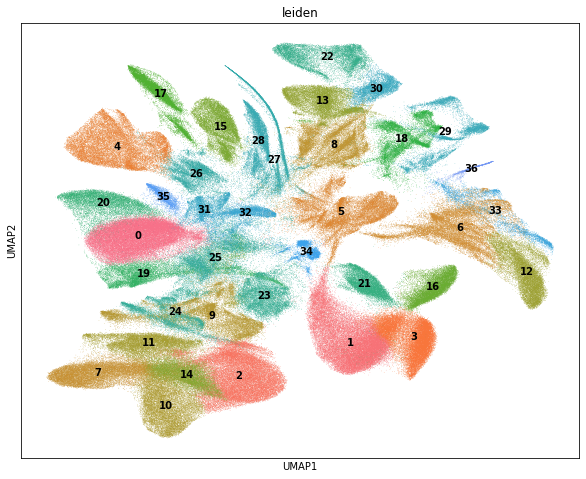

In [7]:
plt.rcParams['figure.figsize'] = (10, 8)

leiden_palette = sns.color_palette("husl", n_colors=51)

sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data',palette=leiden_palette)




/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


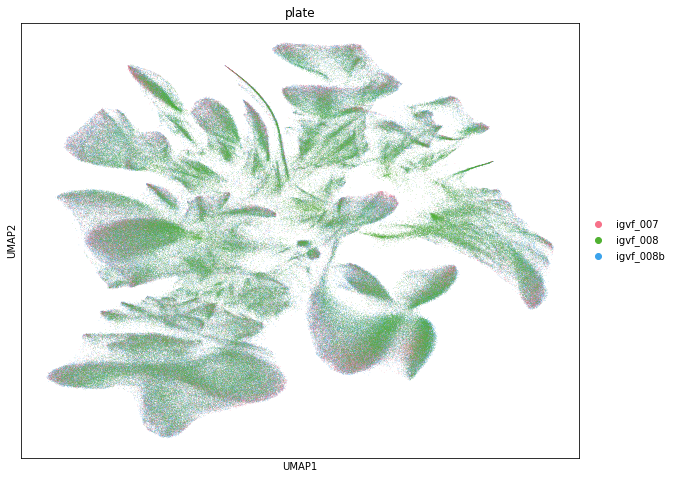

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


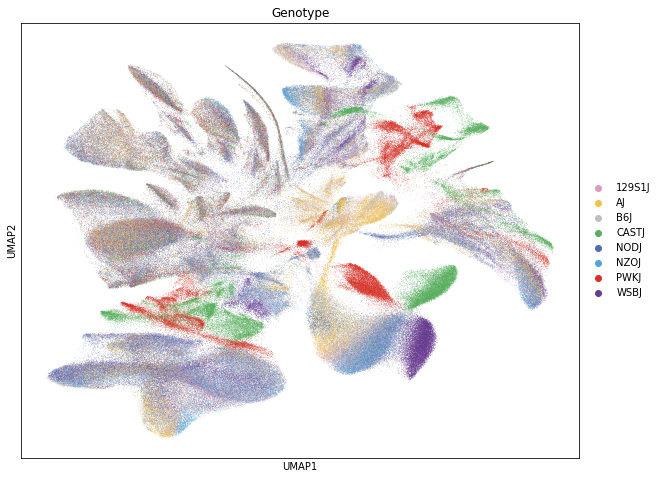

In [8]:
sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)

sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)


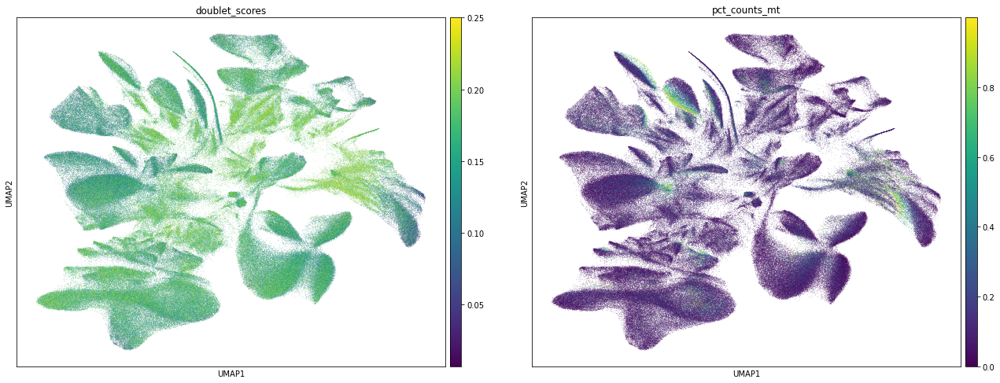

In [9]:
sc.pl.umap(adata, color=['doublet_scores','pct_counts_mt'], size=1)


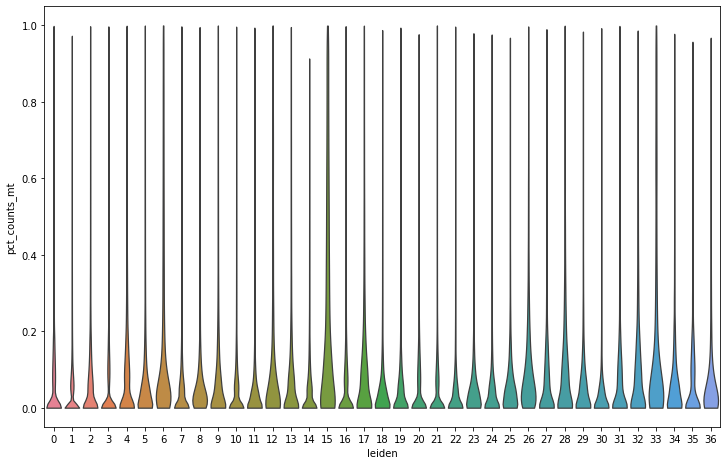

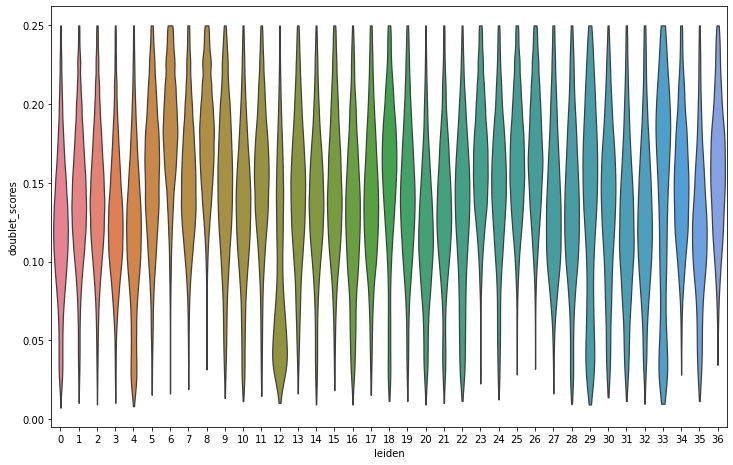

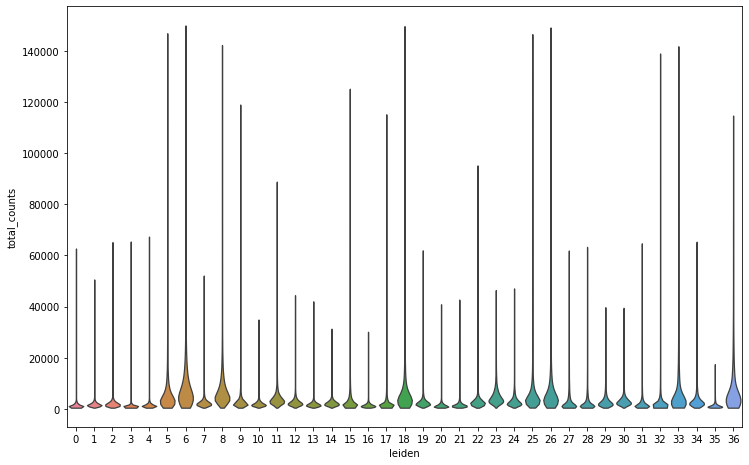

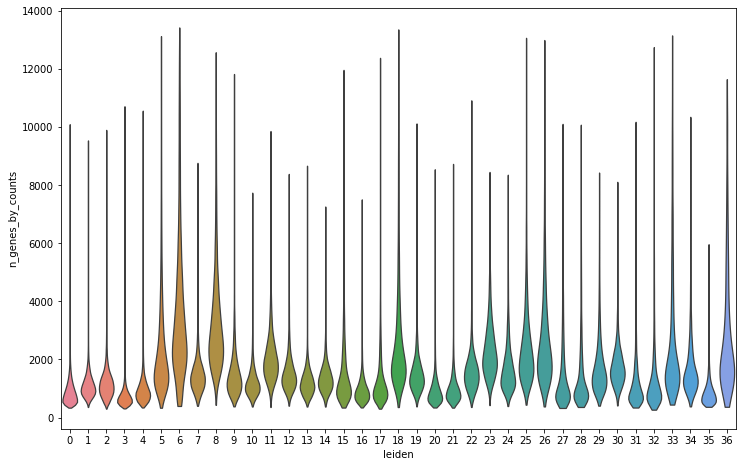

In [10]:
sc.pl.violin(adata, ['pct_counts_mt'],
             groupby = "leiden", 
             jitter=0.4, multi_panel=True, size=0)
sc.pl.violin(adata, ['doublet_scores'],
             groupby = "leiden", 
             jitter=0.4, multi_panel=True, size=0)
sc.pl.violin(adata, ['total_counts'],
             groupby = "leiden", 
             jitter=0.4, multi_panel=True, size=0)
sc.pl.violin(adata, ['n_genes_by_counts'],
             groupby = "leiden", 
             jitter=0.4, multi_panel=True, size=0)


# Check marker gene expression

In [3]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsFemale_filtered.h5ad')


In [4]:
adata.var_names  = adata.var['gene_name']


categories: 0, 1, 2, etc.
var_group_labels: Proximal_oviduct, Distal_oviduct, Secretory_endothelial, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


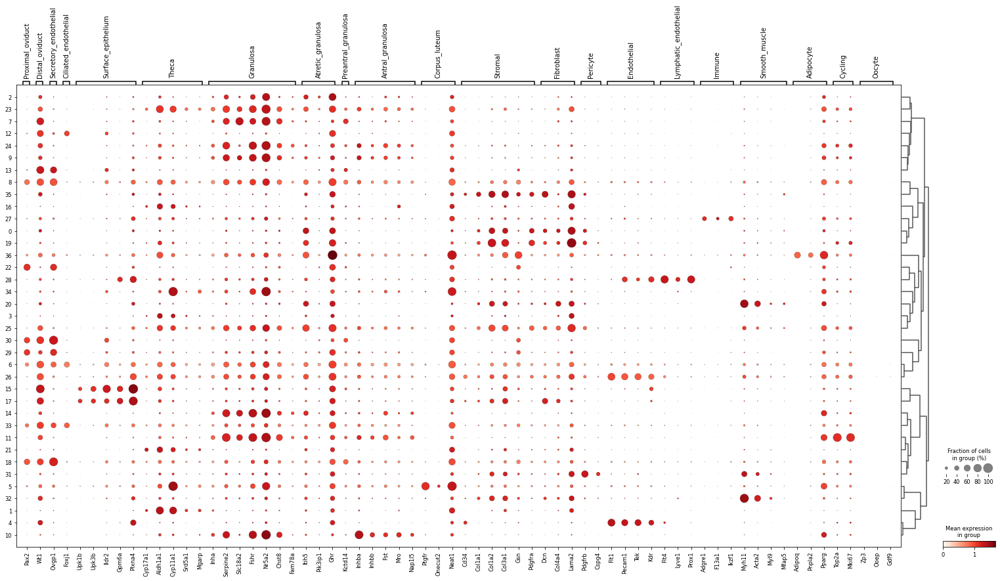

In [5]:
#https://www.cell.com/cell-reports/pdf/S2211-1247(21)01121-9.pdf
#https://www.nature.com/articles/s43587-023-00552-5

curated_marker_genes_dict = {
    "Proximal_oviduct": ['Pax2'],
    "Distal_oviduct": ['Wt1'],
    "Secretory_endothelial": ['Ovgp1'],
    "Ciliated_endothelial": ['Foxj1'],
    "Surface_epithelium": ['Upk1b','Upk3b','Ildr2','Gpm6a','Plxna4'],
    "Theca": ['Cyp17a1','Aldh1a1','Cyp11a1','Srd5a1','Mgarp'],
    "Granulosa": ['Inha','Serpine2','Slc18a2','Fshr', 'Nr5a2','Chst8','Fam78a'],
    "Atretic_granulosa": ['Itih5','Pik3ip1','Ghr'],
    "Preantral_granulosa": ['Kctd14'],
    "Antral_granulosa": ['Inhba','Inhbb','Fst','Mro','Nap1l5'],
    "Corpus_luteum": ['Ptgfr','Onecut2','Neat1'],
    "Stromal": ['Cd34','Col1a1', 'Col1a2', 'Col3a1','Gsn','Pdgfra'],
    "Fibroblast": ["Dcn","Col4a4","Lama2"],
    "Pericyte": ["Pdgfrb","Cspg4"],
    "Endothelial": ["Flt1","Pecam1","Tek","Kdr"],
    "Lymphatic_endothelial": ['Flt4','Lyve1','Prox1'],
    "Immune": ["Adgre1","F13a1","Ikzf1"],
    "Smooth_muscle": ["Myh11","Acta2","Myl9","Mfap5"],
    "Adipocyte": ["Adipoq","Pnpla2","Pparg"],
    "Cycling": ["Top2a","Mki67"],
    "Oocyte": ["Zp3","Ooep","Gdf9"],

               
}

sc.pl.dotplot(adata, curated_marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


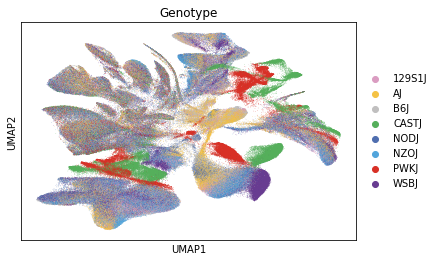

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


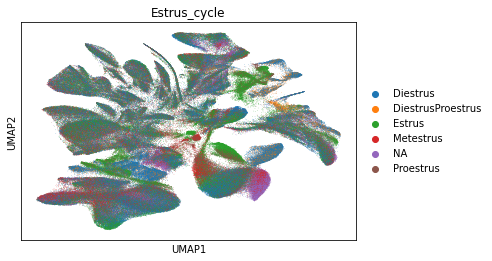

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


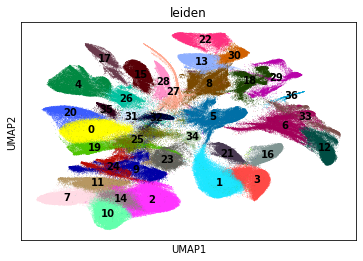

In [6]:
sc.pl.umap(adata, color=['Genotype'], size=1,palette = geno_palette)
sc.pl.umap(adata, color=['Estrus_cycle'], size=1)
sc.pl.umap(adata, color=['leiden'], size=1, legend_loc = 'on data')

categories: 0, 1, 2, etc.
var_group_labels: Active_CL, Antral_Mural, Atretic, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


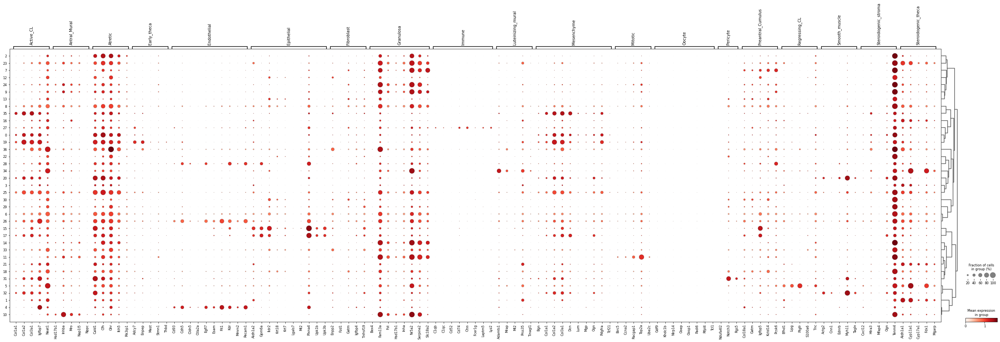

In [7]:
my_markers_df = pd.read_csv("IGVF_curated_markers.csv")
my_markers_df = my_markers_df[my_markers_df['Gene'].isin(adata.var_names)]
my_markers_df = my_markers_df[my_markers_df['Tissue'] == 'GonadsFemale']

marker_genes_dict = my_markers_df.groupby('Subtype')['Gene'].agg(list).to_dict()
sc.pl.dotplot(adata, marker_genes_dict, 'leiden', mean_only_expressed = True,
              dendrogram=True, log=True)


In [8]:
adata

AnnData object with n_obs × n_vars = 509374 × 56953
    obs: 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'subpool', 'bc1_well', 'bc2_well', 'bc3_well', 'Mouse_Tissue_ID', 'alias_tissue1', 'alias_tissue2', 'alias_tissue3', 'alias_tissue4', 'plate', 'Protocol', 'Chemistry', 'well_type', 'Row', 'Column', 'Genotype', 'Notes', 'Multiplexed_sample1', 'Multiplexed_sample2', 'SampleType', 'Tissue', 'Tissue_ID', 'Tissue1_ontology_id', 'Tissue2_ontology_id', 'Sex', 'Replicate', 'DOB', 'Age_weeks', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'Dissector', 'Tissue_weight_mg', 'mult_genotype_1', 'mult_genotype_2', 'mult_genotype', 'n_counts', 'WSBJ', 'NZOJ', '129S1J', 'CASTJ', 'B6J', 'NODJ', 'AJ', 'PWKJ', 'doublet_scores', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means

# Find cluster level markers

In [89]:
adata.uns['log1p']['base'] = None

In [90]:
adata.var_names  = adata.var['gene_name']


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragme

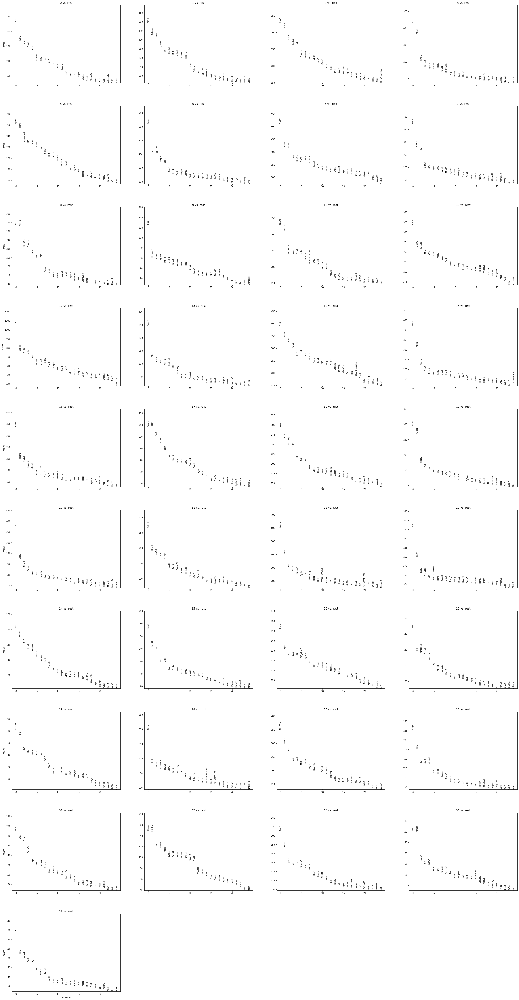

In [91]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)



In [92]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
result = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})


In [93]:
result.to_csv("gonadsfemale_cluster_markers.csv")

# Assign celltypes to clusters

In [21]:
adata = sc.read('../IGVF_analysis/annotated_tissues/GonadsFemale_filtered.h5ad')


In [22]:
annots = pd.read_csv("GonadsFemale_annotations.csv")
annots['leiden'] = annots['leiden'].astype(str)

annotation_dict = annots.groupby('leiden').head(1).set_index('leiden')['general_celltype'].to_dict()
adata.obs['general_celltype'] = adata.obs['leiden'].map(annotation_dict)
annotation_dict = annots.groupby('leiden').head(1).set_index('leiden')['general_CL_ID'].to_dict()
adata.obs['general_CL_ID'] = adata.obs['leiden'].map(annotation_dict)

annotation_dict = annots.groupby('leiden').head(1).set_index('leiden')['celltype'].to_dict()
adata.obs['celltype'] = adata.obs['leiden'].map(annotation_dict)
annotation_dict = annots.groupby('leiden').head(1).set_index('leiden')['CL_ID'].to_dict()
adata.obs['CL_ID'] = adata.obs['leiden'].map(annotation_dict)

annotation_dict = annots.groupby('leiden').head(1).set_index('leiden')['subtype'].to_dict()
adata.obs['subtype'] = adata.obs['leiden'].map(annotation_dict)



/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


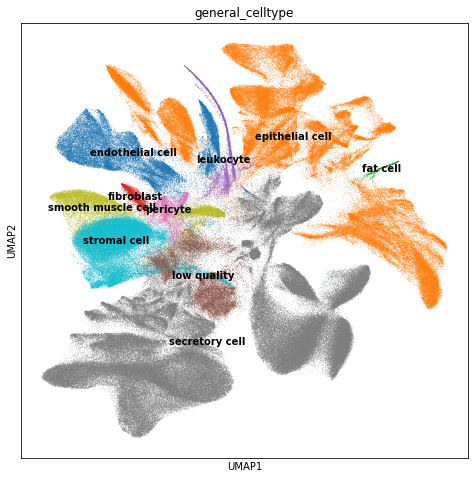

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


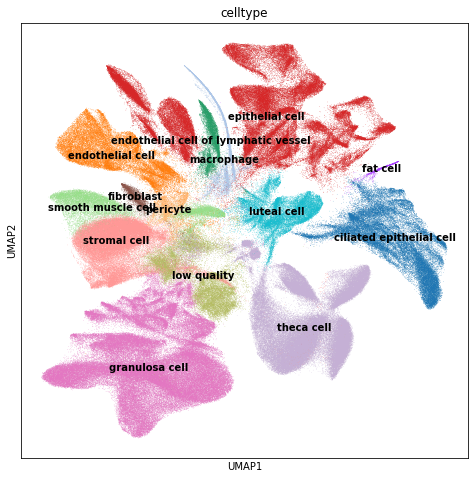

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


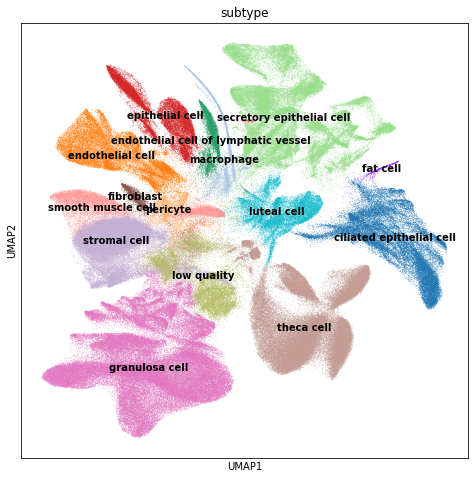

In [23]:
plt.rcParams['figure.figsize'] = (8, 8)

sc.pl.umap(adata, color=['general_celltype'], size=1, legend_loc = 'on data')
sc.pl.umap(adata, color=['celltype'], size=1, legend_loc = 'on data')
sc.pl.umap(adata, color=['subtype'], size=1, legend_loc = 'on data')


In [24]:
sc.tl.dendrogram(adata, groupby = 'subtype')

categories: ciliated epithelial cell, endothelial cell, endothelial cell of lymphatic vessel, etc.
var_group_labels: Proximal_oviduct, Distal_oviduct, Secretory_epithelial, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


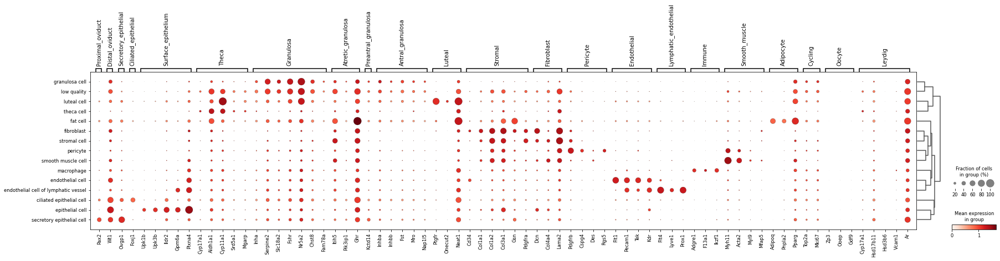

In [25]:
curated_marker_genes_dict = {
    "Proximal_oviduct": ['Pax2'],
    "Distal_oviduct": ['Wt1'],
    "Secretory_epithelial": ['Ovgp1'],
    "Ciliated_epithelial": ['Foxj1'],
    "Surface_epithelium": ['Upk1b','Upk3b','Ildr2','Gpm6a','Plxna4'],
    "Theca": ['Cyp17a1','Aldh1a1','Cyp11a1','Srd5a1','Mgarp'],
    "Granulosa": ['Inha','Serpine2','Slc18a2','Fshr', 'Nr5a2','Chst8','Fam78a'],
    "Atretic_granulosa": ['Itih5','Pik3ip1','Ghr'],
    "Preantral_granulosa": ['Kctd14'],
    "Antral_granulosa": ['Inhba','Inhbb','Fst','Mro','Nap1l5'],
    "Luteal": ['Ptgfr','Onecut2','Neat1'],
    "Stromal": ['Cd34','Col1a1', 'Col1a2', 'Col3a1','Gsn','Pdgfra'],
    "Fibroblast": ["Dcn","Col4a4","Lama2"],
    "Pericyte": ["Pdgfrb","Cspg4","Des","Rgs5"],
    "Endothelial": ["Flt1","Pecam1","Tek","Kdr"],
    "Lymphatic_endothelial": ['Flt4','Lyve1','Prox1'],
    "Immune": ["Adgre1","F13a1","Ikzf1"],
    "Smooth_muscle": ["Myh11","Acta2","Myl9","Mfap5"],
    "Adipocyte": ["Adipoq","Pnpla2","Pparg"],
    "Cycling": ["Top2a","Mki67"],
    "Oocyte": ["Zp3","Ooep","Gdf9"],
    "Leydig": ["Cyp17a1","Hsd17b11","Hsd3b6","Vcam1","Ar"]

               
}
sc.pl.dotplot(adata, curated_marker_genes_dict, 'subtype', mean_only_expressed = True,
              dendrogram=True, log=True)


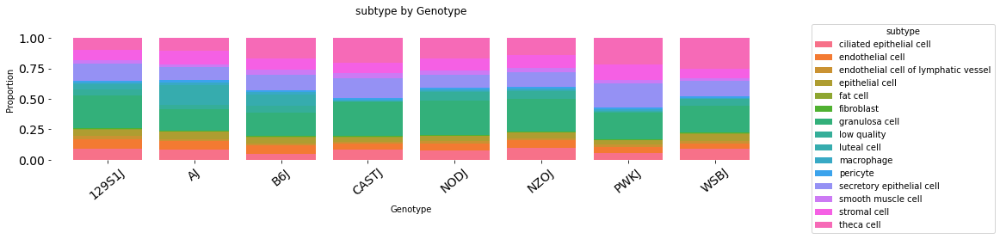

In [26]:

pf.stacked_barplot_proportions(adata.obs, 
                            'Genotype', 'subtype',
                            flip=False, fsize = (15,3), 
                            annotations = False)


In [27]:
adata.write_h5ad('../IGVF_analysis/annotated_tissues/GonadsFemale_annotated.h5ad')


In [28]:
meta = adata.obs
meta.to_csv(f"../IGVF_analysis/annotated_tissues/GonadsFemale_annotated_metadata.csv")

In [3]:
#adata = sc.read("../IGVF_analysis/preprocessed_tissues/GonadsFemalepreprocessed.h5ad")
adata = sc.read("../IGVF_analysis/annotated_tissues/GonadsFemale_annotated.h5ad")


categories: ciliated epithelial cell, endothelial cell, endothelial cell of lymphatic vessel, etc.
var_group_labels: Cycling


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


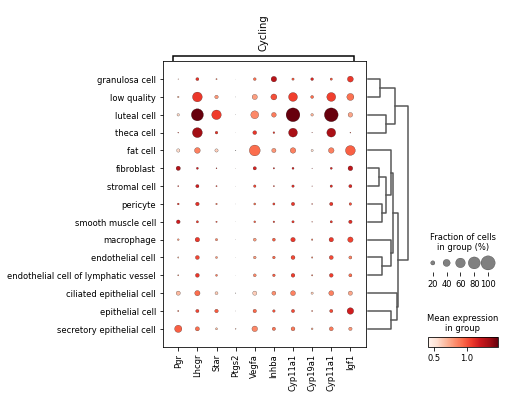

In [7]:
curated_marker_genes_dict = {

    "Cycling": ['Pgr', 'Lhcgr', 'Star', 'Ptgs2', 'Vegfa', 'Inhba', 'Cyp11a1', 'Cyp19a1', 'Cyp11a1', 'Igf1'







],

               
}
sc.pl.dotplot(adata, curated_marker_genes_dict, 'subtype', mean_only_expressed = True,
              dendrogram=True, log=True)


# What happened to my 119 oocytes from nextseq annotations?
Only 8 made it in the filtered version :( 

Only 50 made it in the 200 UMI version! No idea :((((

In [155]:
old_meta = pd.read_csv("/share/crsp/lab/seyedam/share/igvf_splitseq/igvf_008b/seurat/GonadsFemale_Nextseq_seurat_metadata.csv")
oocytes = old_meta[old_meta['celltypes'] == "Oocyte"]
oocytes['new_cellID'] = oocytes['bc1_well'] + "_" + oocytes['bc2_well'] + "_" + oocytes['bc3_well']  + "_" + oocytes['sublibrary']  + "_"  + oocytes['Experiment'] 
oocytes = oocytes[['new_cellID', 'celltypes']]




/tmp/ipykernel_1439620/1538010539.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  oocytes['new_cellID'] = oocytes['bc1_well'] + "_" + oocytes['bc2_well'] + "_" + oocytes['bc3_well']  + "_" + oocytes['sublibrary']  + "_"  + oocytes['Experiment']


In [168]:
#adata = sc.read("../IGVF_analysis/preprocessed_tissues/GonadsFemalepreprocessed.h5ad")
adata = sc.read("../IGVF_analysis/annotated_tissues/GonadsFemale_filtered.h5ad")


In [169]:
adata.obs['original_subpool_name'] = adata.obs['subpool'] 

In [170]:
replacement_dict = {
    'Sublibrary_2': '67B',
    'Sublibrary_3': '67C',
    'Sublibrary_4': '67D',
    'Sublibrary_5': '67E',
    'Sublibrary_6': '67F',
    'Sublibrary_7': '67G',
    'Sublibrary_8': '67H',
    'Sublibrary_9': '67I',
    'Sublibrary_10': '67J',
    'Sublibrary_11': '67K',
    'Sublibrary_12': '67L',
    'Sublibrary_13': '67M',
    'Sublibrary_14': '67N',
    'Sublibrary_15': '67O',
    'Sublibrary_16': '67P'
    
}

# Assuming adata is your DataFrame
adata.obs['original_subpool_name'] = adata.obs['original_subpool_name'].replace(replacement_dict)


In [171]:
adata.obs['new_cellID'] = (
    adata.obs['bc1_well'].astype(str) +
    "_" +
    adata.obs['bc2_well'].astype(str) +
    "_" +
    adata.obs['bc3_well'].astype(str) +
    "_" +
    adata.obs['original_subpool_name'].astype(str) +
    "_" +
    adata.obs['plate'].astype(str)
)


In [186]:
meta = adata.obs

In [187]:
meta['new_cellID'].isin(oocytes['new_cellID']).value_counts()



new_cellID
False    509366
True          8
Name: count, dtype: int64

In [188]:
why = meta[meta['new_cellID'].isin(oocytes['new_cellID'])]


In [189]:
why['plate'].value_counts()

plate
igvf_008     5
igvf_008b    2
igvf_007     1
Name: count, dtype: int64

In [190]:
why['celltype'].value_counts()

celltype
Stromal                  3
Theca                    3
Ciliated_endothelial     1
Endothelial              1
Adipocyte                0
Epithelial               0
Fibroblast               0
Granulosa                0
Lymphatic_endothelial    0
Macrophage               0
Pericyte                 0
Secretory_endothelial    0
Smooth_muscle            0
Name: count, dtype: int64

In [191]:
why['leiden'].value_counts()

leiden
0     3
5     3
4     1
6     1
28    0
22    0
23    0
24    0
25    0
26    0
27    0
30    0
29    0
20    0
31    0
32    0
33    0
34    0
35    0
21    0
18    0
19    0
1     0
17    0
16    0
15    0
14    0
13    0
12    0
11    0
10    0
9     0
8     0
7     0
3     0
2     0
36    0
Name: count, dtype: int64

# Pseudobulk PCA

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
import anndata
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import random


<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
tissue = "GonadsFemale"
adata = sc.read(f"../IGVF_analysis/annotated_tissues/{tissue}_annotated.h5ad")
adata = adata[(adata.obs['Genotype'] != "tie")]
adata = adata[~adata.obs['celltype'].isin(["low quality"])]


In [3]:
adata.obs['Mouse_Tissue_ID'] = adata.obs['Mouse_Tissue_ID'].astype(str)


/tmp/ipykernel_3456104/2200752215.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['Mouse_Tissue_ID'] = adata.obs['Mouse_Tissue_ID'].astype(str)


In [4]:
# adjust mouse_tissue_id
ms1 = ['B6J','AJ','WSBJ','129S1J']
ms2 = ['NODJ','PWKJ','NZOJ','CASTJ']

# Define a function to update 'Mouse_Tissue_ID' based on conditions
def update_mouse_tissue_id(row):
    if row['plate'] != 'igvf_012' and row['Column'] in [9, 10, 11, 12]:
        if row['Genotype'] in ms1:
            return row['Multiplexed_sample1']
        elif row['Genotype'] in ms2:
            return row['Multiplexed_sample2']
    return row['Mouse_Tissue_ID']

meta = adata.obs

# Apply the function to update the 'Mouse_Tissue_ID' column
meta['Mouse_Tissue_ID'] = meta.apply(update_mouse_tissue_id, axis=1)
adata.obs['Mouse_Tissue_ID'] = meta['Mouse_Tissue_ID']



In [5]:
import decoupler as dc

pdata = dc.get_pseudobulk(
    adata,
    sample_col='Mouse_Tissue_ID',
    groups_col=None,
    obs=adata.obs,
    layer='raw_counts',
    mode='sum',
    min_cells=10,
    min_counts=10000
)


In [6]:
for c in pdata.obs.columns:
        if pd.api.types.is_object_dtype(pdata.obs[c].dtype):
            pdata.obs[c] = pdata.obs[c].fillna('NA')

In [7]:
pdata.write_h5ad(f'../IGVF_analysis/pseudobulk/{tissue}_pseudobulk_raw.h5ad')


In [8]:
sc.pp.normalize_total(pdata, target_sum=1e4) # Counts per 10k
sc.pp.log1p(pdata)

sc.tl.pca(pdata, svd_solver='arpack', use_highly_variable = False)



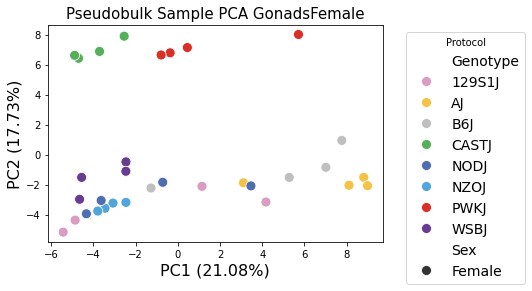

In [10]:
df = pd.DataFrame(pdata.obsm["X_pca"])
meta  = pdata.obs
df.set_index(meta['Mouse_Tissue_ID'], inplace=True)
merged_df = pd.merge(df, meta, left_index=True, right_on='Mouse_Tissue_ID')

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


sns.scatterplot(x=merged_df.iloc[:, 0], y=merged_df.iloc[:, 1], 
                hue=merged_df['Genotype'], 
                style=merged_df['Sex'], 
                s=100, 
                palette=geno_palette,
                alpha=1)  # Adjust transparency if needed

plt.xlabel("PC1", fontsize=16)
plt.ylabel("PC2", fontsize=16)
plt.title(f'Pseudobulk Sample PCA {tissue}', fontsize=15)

plt.legend(title='Protocol', fontsize=14, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(False)
pc1 = pdata.uns["pca"]["variance_ratio"][0]
pc2 = pdata.uns["pca"]["variance_ratio"][1]
plt.xlabel(f"PC1 ({pc1:.2%})", fontsize=16)
plt.ylabel(f"PC2 ({pc2:.2%})", fontsize=16)


plt.show()


# Pseudobulk subtype expression

In [1]:
import scanpy as sc
import decoupler as dc
import pandas as pd

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
tissue = "GonadsFemale"
adata = sc.read(f"../IGVF_analysis/tissue_processed_500umi/{tissue}_processed.h5ad")


In [3]:
meta = pd.read_csv(f"../IGVF_analysis/annotated_tissues/{tissue}_annotated_metadata.csv")
cell_mapper = dict(zip(meta['cellID'], meta['subtype']))

adata.obs['subtype'] = adata.obs.index.map(cell_mapper)
mask = ~adata.obs['subtype'].isna()
adata = adata[mask]


/tmp/ipykernel_3360870/204417760.py:1: DtypeWarning: Columns (12,13,31,36,37,40,41,42) have mixed types. Specify dtype option on import or set low_memory=False.
  meta = pd.read_csv(f"../IGVF_analysis/annotated_tissues/{tissue}_annotated_metadata.csv")


In [4]:
pdata = dc.get_pseudobulk(
    adata,
    sample_col="subtype",
    groups_col=None,
    obs=adata.obs,
    layer='raw_counts',
    mode='sum',
    min_cells=10,
    min_counts=10000
)

for c in pdata.obs.columns:
        if pd.api.types.is_object_dtype(pdata.obs[c].dtype):
            pdata.obs[c] = pdata.obs[c].fillna('NA')
            
pdata.write_h5ad(f'../IGVF_analysis/pseudobulk/{tissue}_pseudobulk_subtype_sum.h5ad')


In [5]:
pdata = dc.get_pseudobulk(
    adata,
    sample_col="subtype",
    groups_col=None,
    obs=adata.obs,
    layer='raw_counts',
    mode='median',
    min_cells=10,
    min_counts=10000
)

for c in pdata.obs.columns:
        if pd.api.types.is_object_dtype(pdata.obs[c].dtype):
            pdata.obs[c] = pdata.obs[c].fillna('NA')
            
pdata.write_h5ad(f'../IGVF_analysis/pseudobulk/{tissue}_pseudobulk_subtype_median.h5ad')


In [6]:
pdata = dc.get_pseudobulk(
    adata,
    sample_col="subtype",
    groups_col=None,
    obs=adata.obs,
    layer='raw_counts',
    mode='mean',
    min_cells=10,
    min_counts=10000
)

for c in pdata.obs.columns:
        if pd.api.types.is_object_dtype(pdata.obs[c].dtype):
            pdata.obs[c] = pdata.obs[c].fillna('NA')
            

pdata.write_h5ad(f'../IGVF_analysis/pseudobulk/{tissue}_pseudobulk_subtype_mean.h5ad')
